## Importing Libraries

In [51]:
import os
import shutil
import zipfile
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from imutils import paths

## Data Preprocessing

In [52]:
# Masukan nama file zip yang akan digunakan
path_zip = 'bisindo.zip'

# Folder untuk menyimpan hasil extract file zip
path_extract = 'bisindo'

# Mengekstrak file zip
with zipfile.ZipFile(path_zip, 'r') as zip_ref:
    zip_ref.extractall(path_extract)

# Menampilkan daftar file yang telah diekstrak
extracted_files = os.listdir(path_extract)
print('File yang telah diekstrak:', extracted_files)

File yang telah diekstrak: ['images']


## Data Exploration

Training Dataset:


Class: O - Sample Quantity: 357
-----------------------------------------------------


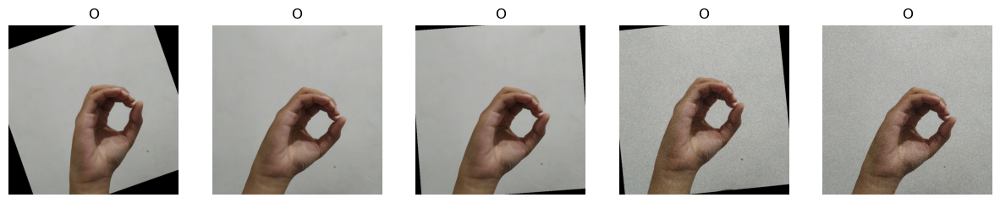

Class: Q - Sample Quantity: 348
-----------------------------------------------------


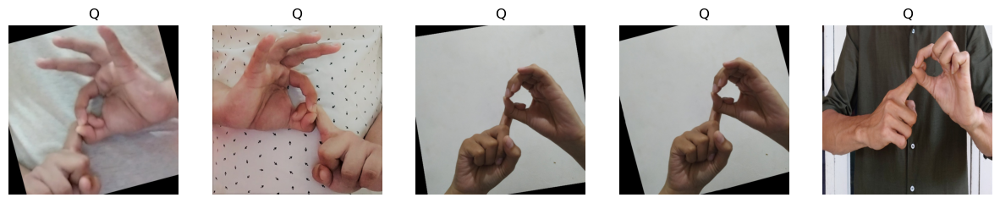

Class: K - Sample Quantity: 348
-----------------------------------------------------


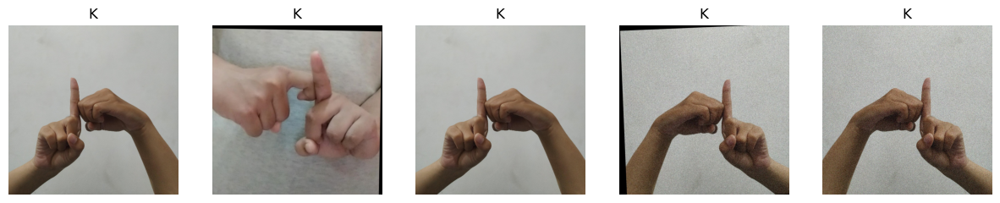

Class: G - Sample Quantity: 360
-----------------------------------------------------


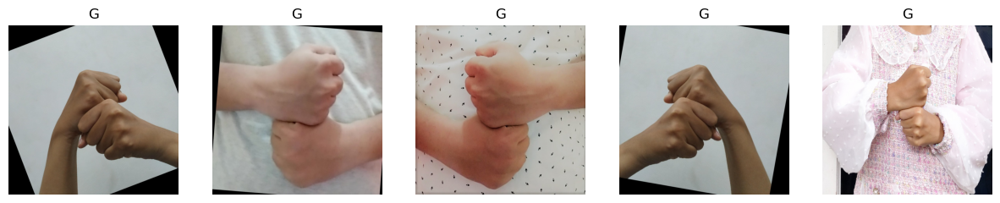

Class: P - Sample Quantity: 357
-----------------------------------------------------


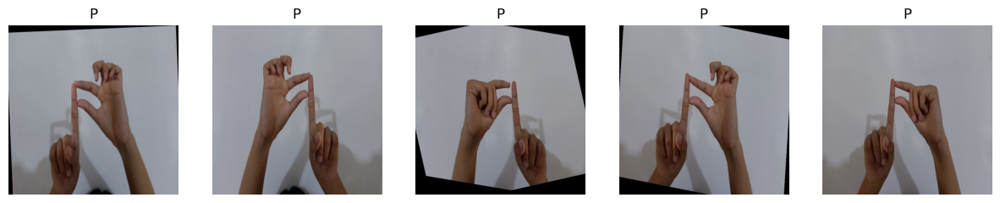

Class: R - Sample Quantity: 350
-----------------------------------------------------


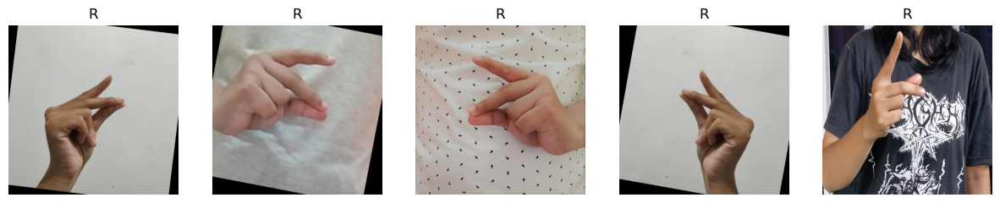

Class: X - Sample Quantity: 355
-----------------------------------------------------


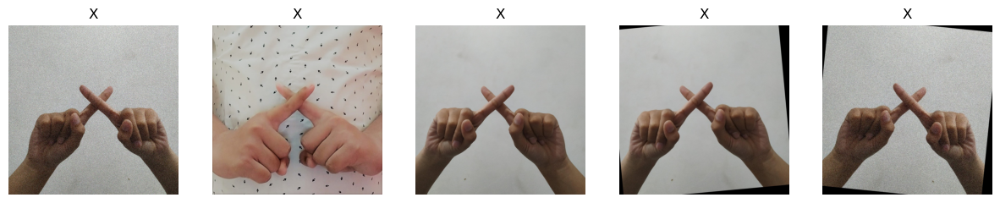

Class: M - Sample Quantity: 355
-----------------------------------------------------


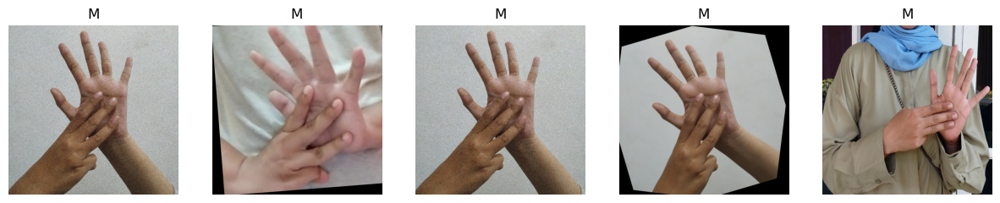

Class: F - Sample Quantity: 357
-----------------------------------------------------


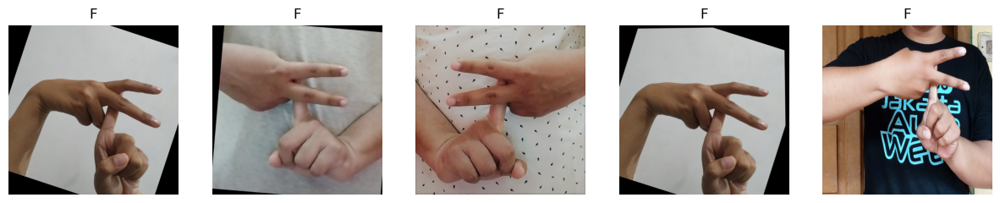

Class: U - Sample Quantity: 355
-----------------------------------------------------


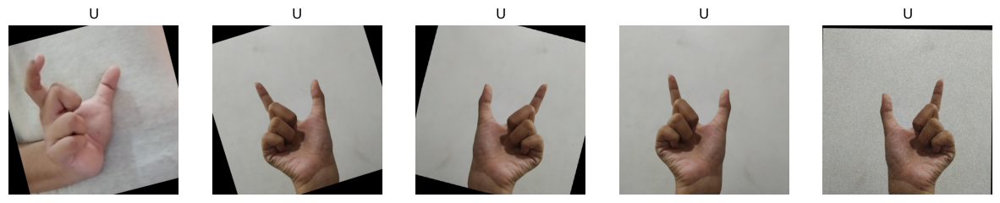

Class: V - Sample Quantity: 357
-----------------------------------------------------


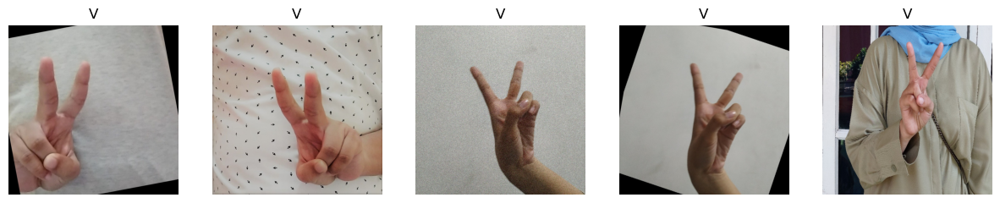

Class: L - Sample Quantity: 357
-----------------------------------------------------


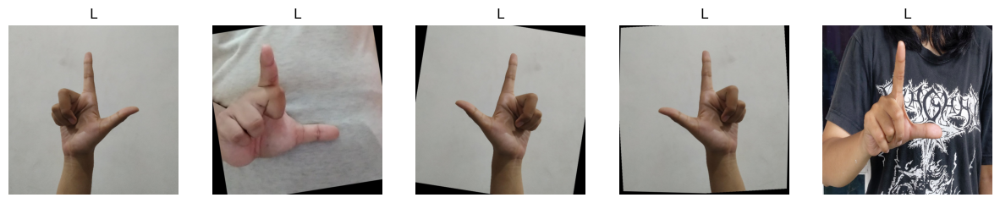

Class: J - Sample Quantity: 360
-----------------------------------------------------


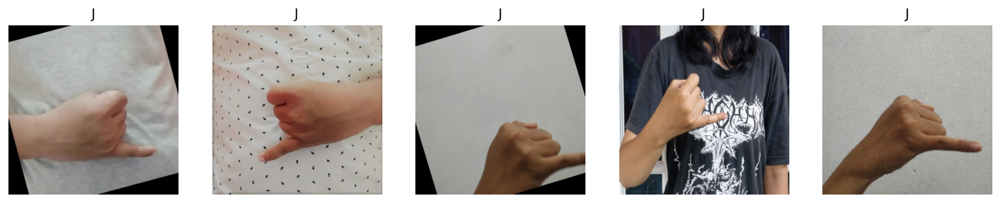

Class: E - Sample Quantity: 352
-----------------------------------------------------


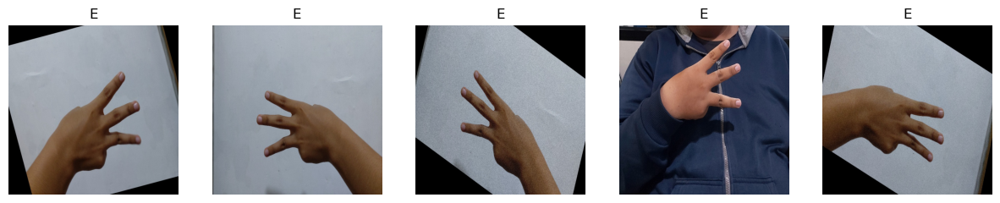

Class: B - Sample Quantity: 351
-----------------------------------------------------


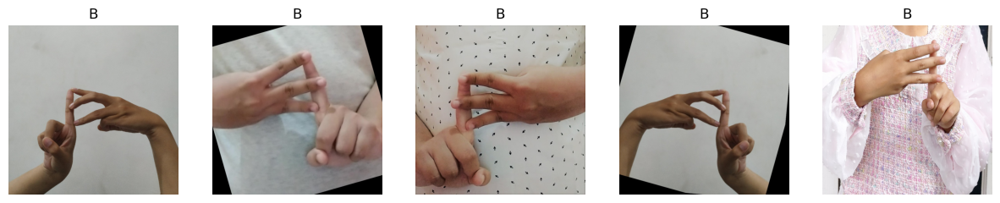

Class: T - Sample Quantity: 360
-----------------------------------------------------


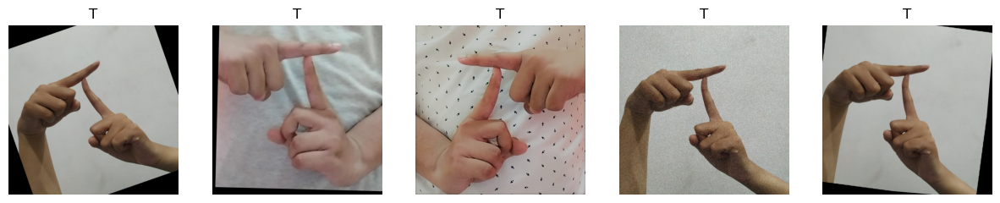

Class: Y - Sample Quantity: 328
-----------------------------------------------------


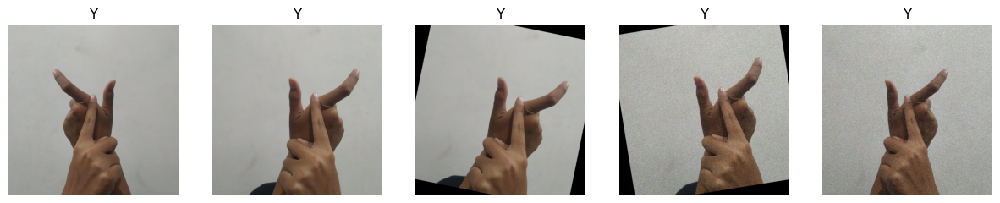

Class: Z - Sample Quantity: 360
-----------------------------------------------------


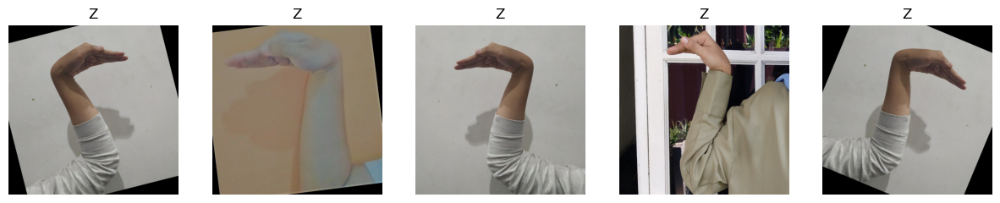

Class: W - Sample Quantity: 360
-----------------------------------------------------


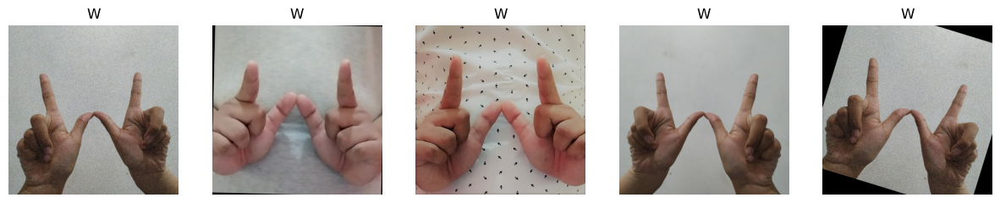

Class: D - Sample Quantity: 348
-----------------------------------------------------


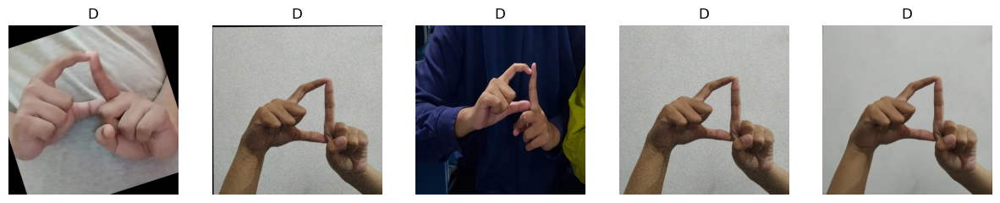

Class: S - Sample Quantity: 343
-----------------------------------------------------


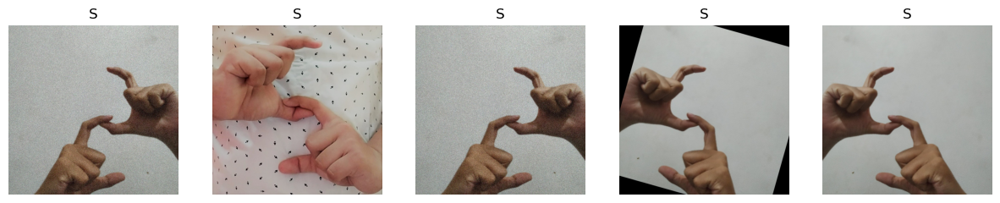

Class: H - Sample Quantity: 348
-----------------------------------------------------


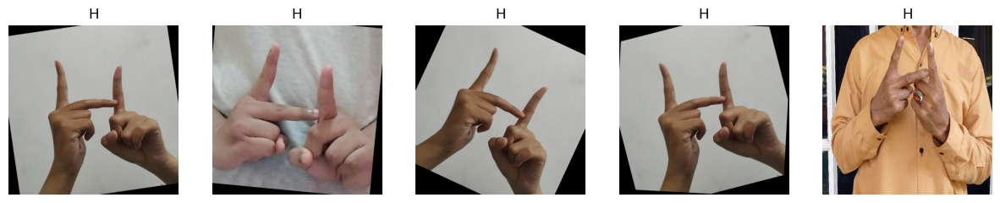

Class: C - Sample Quantity: 343
-----------------------------------------------------


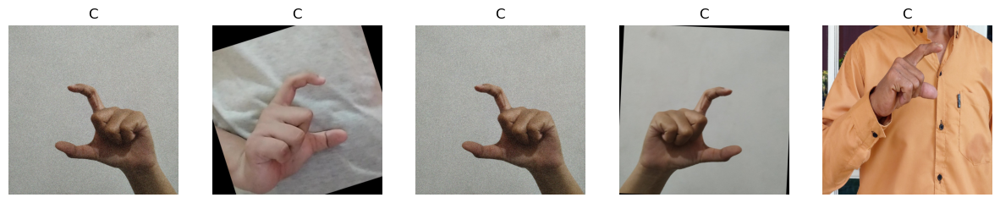

Class: I - Sample Quantity: 360
-----------------------------------------------------


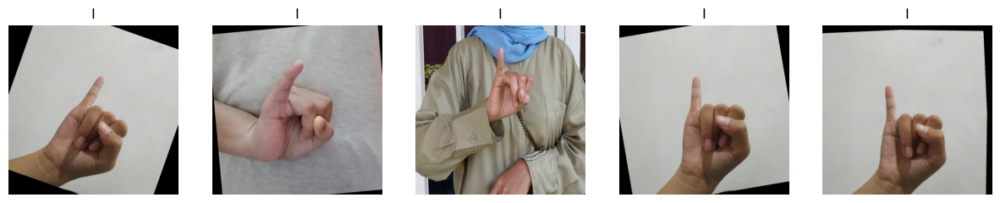

Class: N - Sample Quantity: 350
-----------------------------------------------------


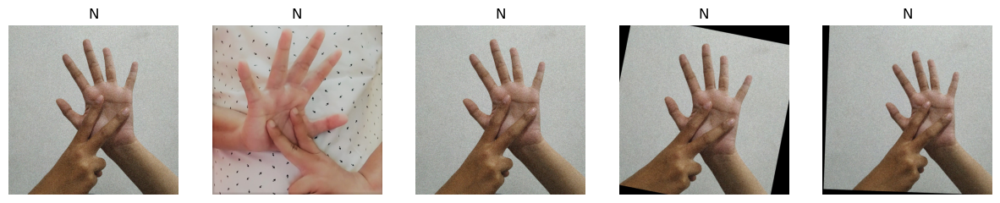

Class: A - Sample Quantity: 350
-----------------------------------------------------


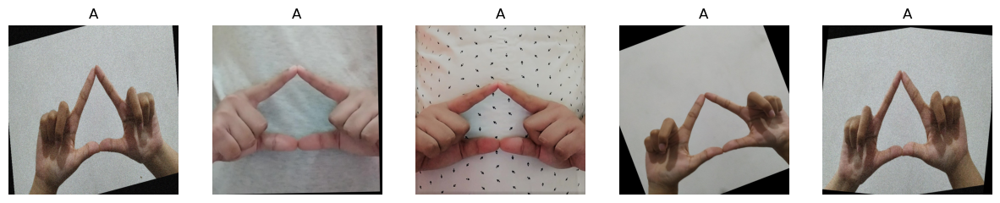


Validation Dataset:


Class: O - Sample Quantity: 90
-----------------------------------------------------


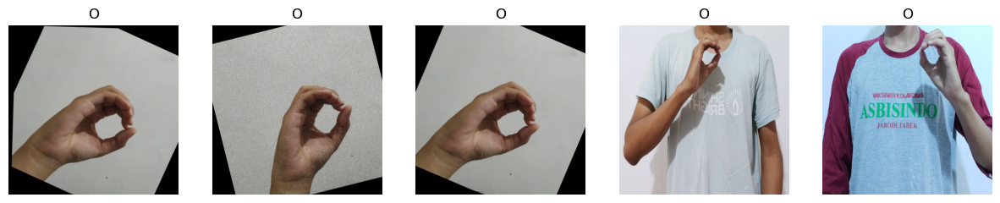

Class: Q - Sample Quantity: 87
-----------------------------------------------------


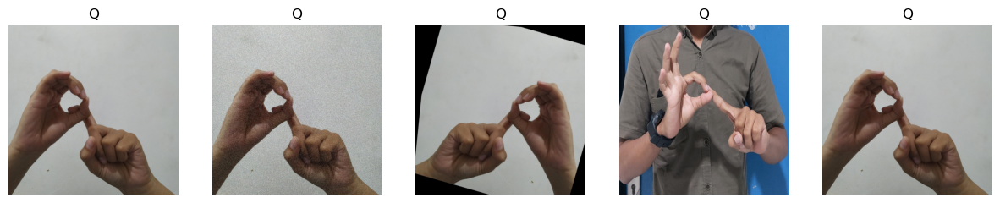

Class: K - Sample Quantity: 87
-----------------------------------------------------


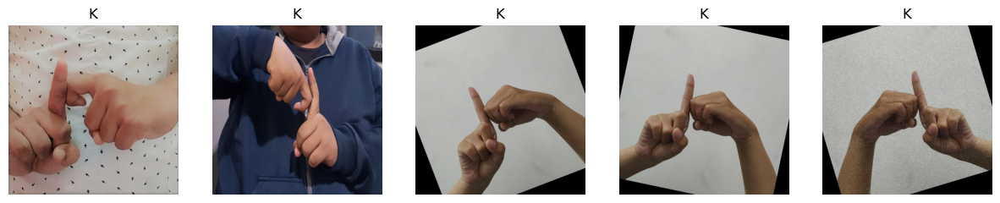

Class: G - Sample Quantity: 90
-----------------------------------------------------


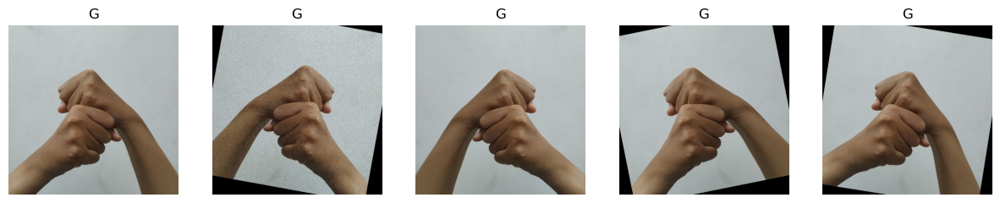

Class: P - Sample Quantity: 90
-----------------------------------------------------


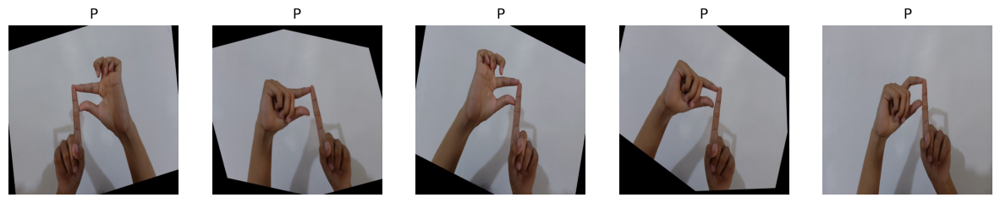

Class: R - Sample Quantity: 88
-----------------------------------------------------


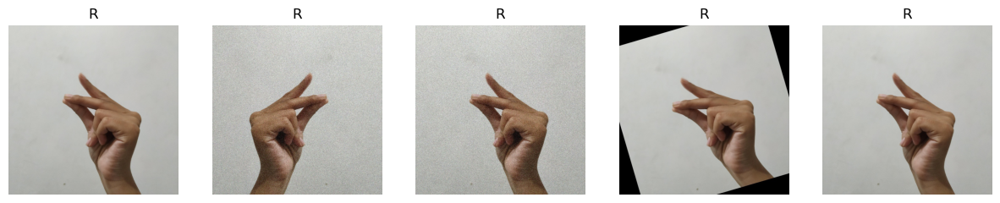

Class: X - Sample Quantity: 89
-----------------------------------------------------


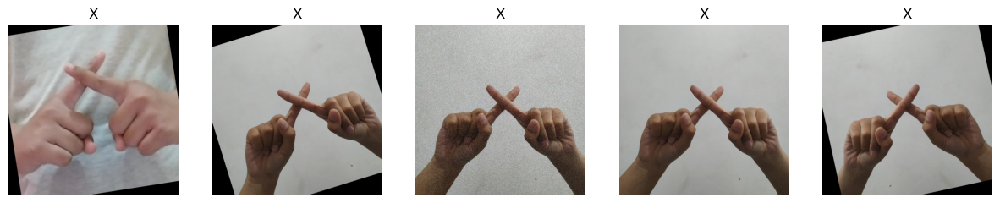

Class: M - Sample Quantity: 89
-----------------------------------------------------


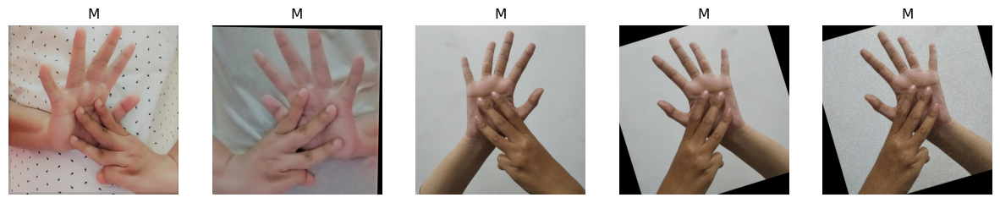

Class: F - Sample Quantity: 90
-----------------------------------------------------


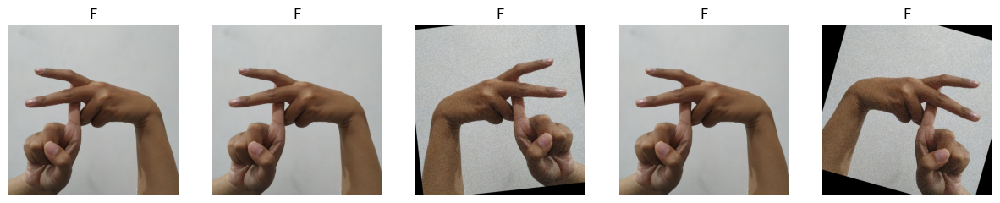

Class: U - Sample Quantity: 89
-----------------------------------------------------


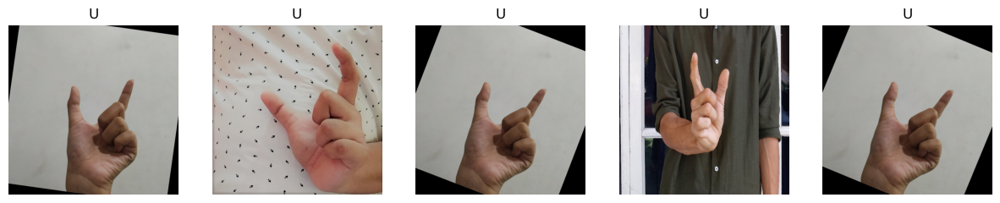

Class: V - Sample Quantity: 90
-----------------------------------------------------


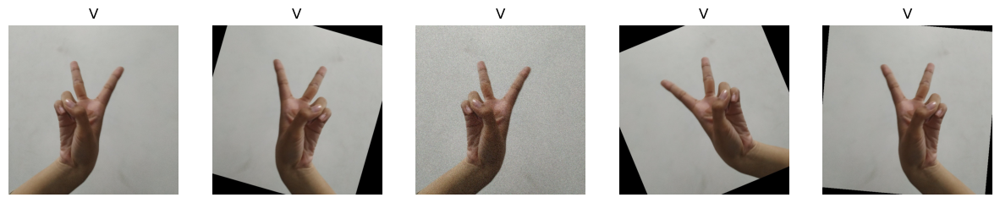

Class: L - Sample Quantity: 90
-----------------------------------------------------


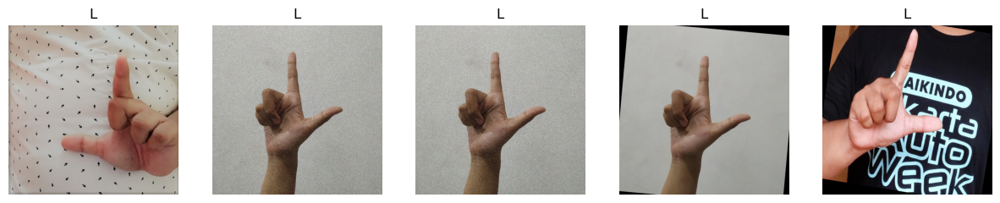

Class: J - Sample Quantity: 90
-----------------------------------------------------


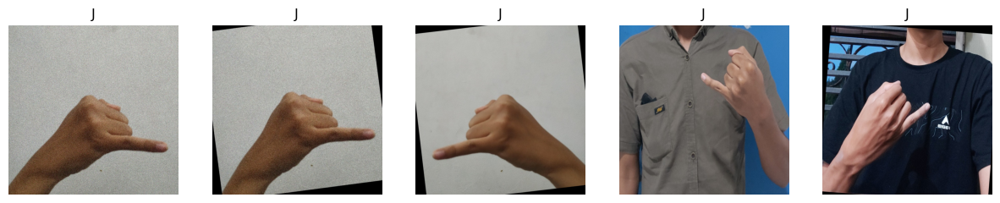

Class: E - Sample Quantity: 89
-----------------------------------------------------


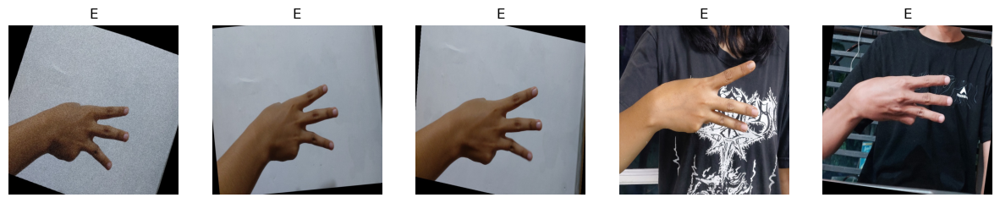

Class: B - Sample Quantity: 88
-----------------------------------------------------


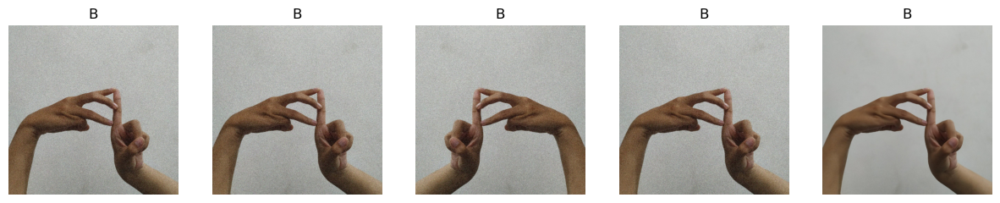

Class: T - Sample Quantity: 90
-----------------------------------------------------


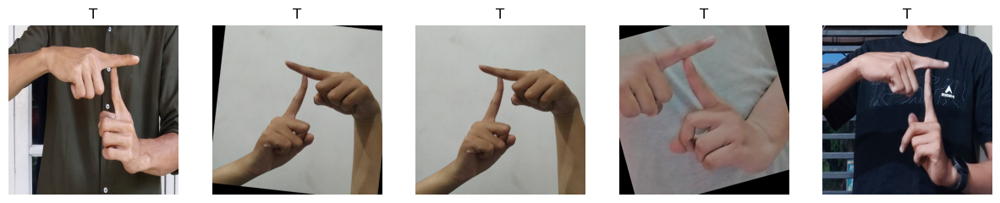

Class: Y - Sample Quantity: 83
-----------------------------------------------------


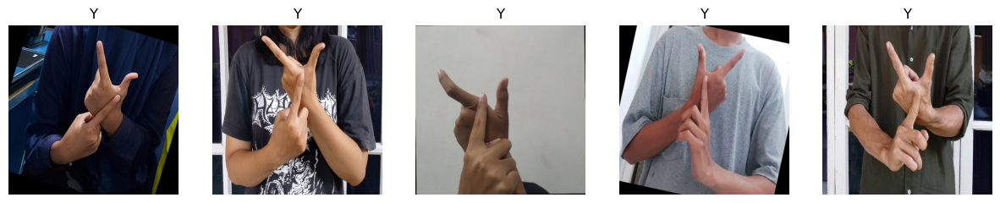

Class: Z - Sample Quantity: 90
-----------------------------------------------------


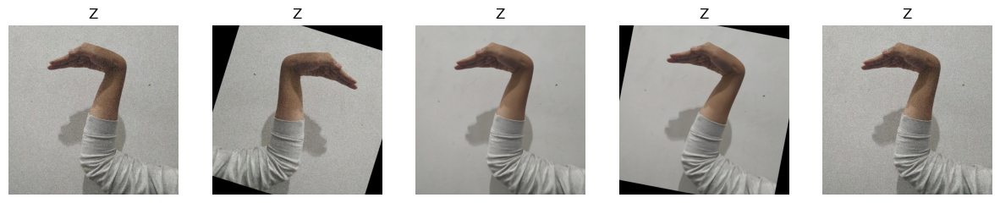

Class: W - Sample Quantity: 90
-----------------------------------------------------


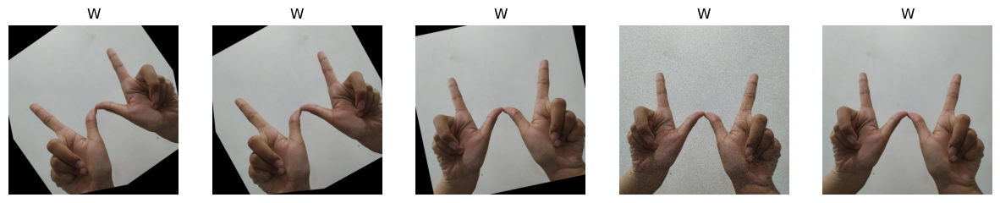

Class: D - Sample Quantity: 87
-----------------------------------------------------


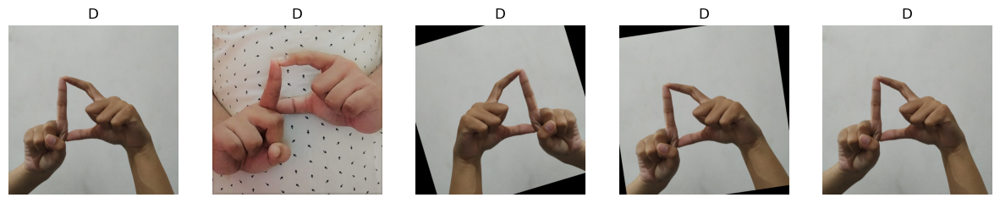

Class: S - Sample Quantity: 86
-----------------------------------------------------


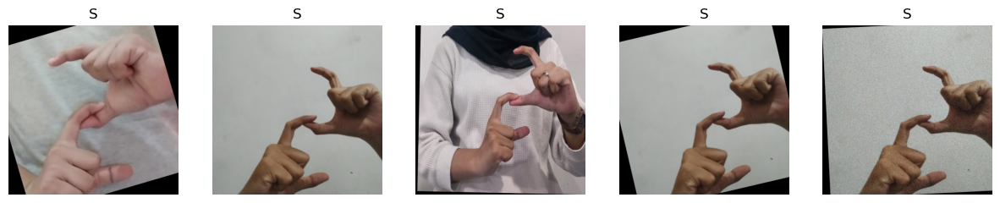

Class: H - Sample Quantity: 87
-----------------------------------------------------


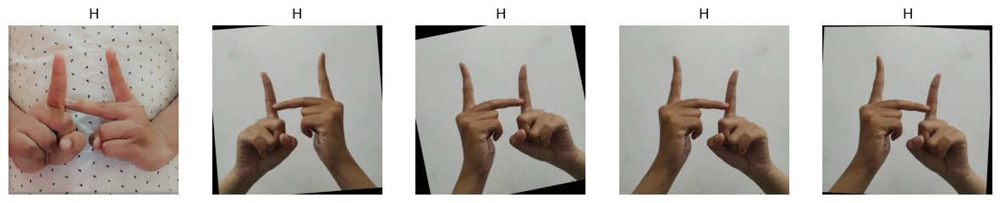

Class: C - Sample Quantity: 86
-----------------------------------------------------


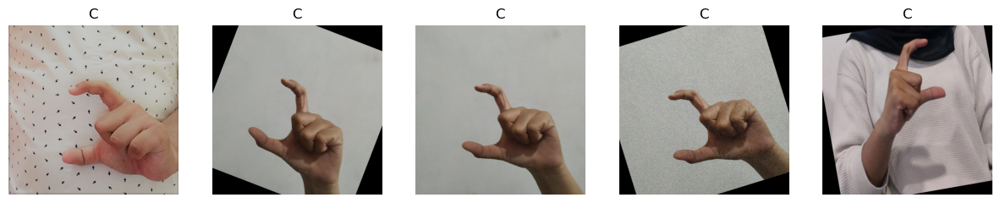

Class: I - Sample Quantity: 90
-----------------------------------------------------


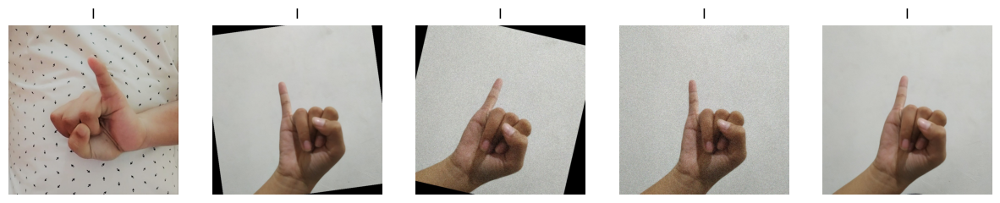

Class: N - Sample Quantity: 88
-----------------------------------------------------


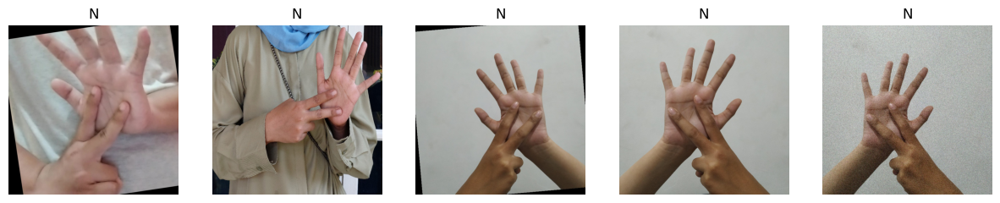

Class: A - Sample Quantity: 88
-----------------------------------------------------


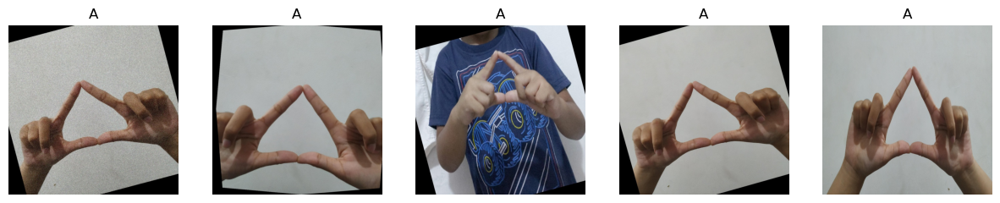

In [53]:
BASE_DIR = 'bisindo/images'

TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')

#Buat dictionary
train_class_counts = {}
val_class_counts = {}

def display_class_samples(path_dataset, class_counts):
    for class_name in os.listdir(path_dataset):
        class_folder = os.path.join(path_dataset, class_name)
        #Loop folder
        if os.path.isdir(class_folder):
            # Menghitung jumlah gambar per kelas
            num_images = len(os.listdir(class_folder))
            class_counts[class_name] = num_images

            # Menampilkan gambar acak per kelas
            print(f'Class: {class_name} - Sample Quantity: {num_images}')
            print('-----------------------------------------------------')
            plt.figure(figsize=(15, 10))
            for i, image_file in enumerate(os.listdir(class_folder)[:5]):
                image_path = os.path.join(class_folder, image_file)
                plt.subplot(1, 5, i + 1)
                image = mpimg.imread(image_path)
                plt.imshow(image)
                plt.title(class_name)
                plt.axis('off')
            plt.show()

# Tampilkan jumlah dan contoh gambar pada dataset train
if os.path.exists(TRAIN_DIR):
    print('Training Dataset:')
    print('\n')
    display_class_samples(TRAIN_DIR, train_class_counts)
else:
    print('Folder train tidak ditemukan.')

# Tampilkan jumlah dan contoh gambar pada dataset train
if os.path.exists(VAL_DIR):
    print('\nValidation Dataset:')
    print('\n')
    display_class_samples(VAL_DIR, val_class_counts)
else:
    print('Folder val tidak ditemukan.')

In [54]:
#Menghitung hash gambar menggunakan metode dhash
def dhash(image, hashSize=8):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray, (hashSize + 1, hashSize))
    diff = resized[:, 1:] > resized[:, :-1]
    return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v])

#Menentukan direktori dataset dan pengaturan menghapus gambar duplikat 
dataset_dir = BASE_DIR
remove_duplicates = True

#Menghitung hash masing-masing gambar
print('[INFO] computing image hashes...')
imagePaths = list(paths.list_images(dataset_dir))
hashes = {}

#Loop memproses gambar yang ada di dataset
for imagePath in imagePaths:
    image = cv2.imread(imagePath)
    img_hash = dhash(image)
    img_list = hashes.get(img_hash, [])
    img_list.append(imagePath)
    hashes[img_hash] = img_list

#Loop untuk menemukan duplikat dan menghapus gambar duplikat
for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        if not remove_duplicates:
            montage = None
            for path in duplicatePaths:
                image = cv2.imread(path)
                image = cv2.resize(image, (150, 150))
                if montage is None:
                    montage = image
                else:
                    montage = np.hstack([montage, image])
            print(f"[INFO] hash: {img_hash}")
            cv2.imshow('Montage', montage)
            cv2.waitKey(0)
        else:
            for duplicate_path in duplicatePaths[1:]:
                os.remove(duplicate_path)
                print(f"[INFO] Removed duplicate: {duplicate_path}")

[INFO] computing image hashes...
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_62.jpg
[INFO] Removed duplicate: bisindo/images/val/O/augmented_image_96.jpg
[INFO] Removed duplicate: bisindo/images/val/O/augmented_image_74.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_20.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_6.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_58.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_42.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_87.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_38.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_29.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_76.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_82.jpg
[INFO] Removed duplicate: bisindo/images/train/O/augmented_image_57.jpg
[INFO] Removed duplicate: bisindo/im

In [55]:
duplicate_count = 0

for (img_hash, duplicatePaths) in hashes.items():
    if len(duplicatePaths) > 1:
        duplicate_count += len(duplicatePaths) - 1

# Menampilkan jumlah total gambar duplikat yang telah dihapus
print(f"Total gambar duplikat yang dihapus: {duplicate_count}")

Total gambar duplikat yang dihapus: 1581


In [56]:
# Path ke folder dataset
path_train = os.path.join(BASE_DIR, 'train')
path_val = os.path.join(BASE_DIR, 'val')
path_test = os.path.join(BASE_DIR, 'test')

# Rasio pembagian dataset
val_ratio = 0.5
test_ratio = 0.5

# Fungsi untuk membagi data dari folder val menjadi val dan test
def split_val_data(val_folder, val_ratio, test_ratio):
    for class_name in os.listdir(val_folder):
        class_folder = os.path.join(val_folder, class_name)

        if os.path.isdir(class_folder):
            val_class_folder = os.path.join(path_val, class_name)
            test_class_folder = os.path.join(path_test, class_name)

            os.makedirs(val_class_folder, exist_ok=True)
            os.makedirs(test_class_folder, exist_ok=True)

            image_files = [f for f in os.listdir(class_folder) if f.endswith(('jpg', 'png'))]

            val_files, test_files = train_test_split(image_files, train_size=val_ratio, random_state=42)

            for file_list, target_folder in [(val_files, val_class_folder),
                                             (test_files, test_class_folder)]:
                for file in file_list:
                    src = os.path.join(class_folder, file)
                    dst = os.path.join(target_folder, file)
                    shutil.move(src, dst)

split_val_data(path_val, val_ratio, test_ratio)

print("Folder val telah dibagi menjadi validation dan test sets.")

Folder val telah dibagi menjadi validation dan test sets.


In [57]:
# Fungsi untuk menghitung total gambar dan distribusi per kelas
def count_total_images(folder_path):
    total_count = 0
    class_counts = {}
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            count = len([f for f in os.listdir(class_folder) if f.endswith(('jpg', 'png'))])
            class_counts[class_name] = count
            total_count += count
    return class_counts, total_count

# Menghitung total gambar dan distribusi di folder train, val, dan test
train_class_counts, train_total = count_total_images(path_train)
val_class_counts, val_total = count_total_images(path_val)
test_class_counts, test_total = count_total_images(path_test)

print(f"Total gambar di folder train: {train_total}")
print(f"Total gambar di folder val: {val_total}")
print(f"Total gambar di folder test: {test_total}")

Total gambar di folder train: 7863
Total gambar di folder val: 1011
Total gambar di folder test: 1015


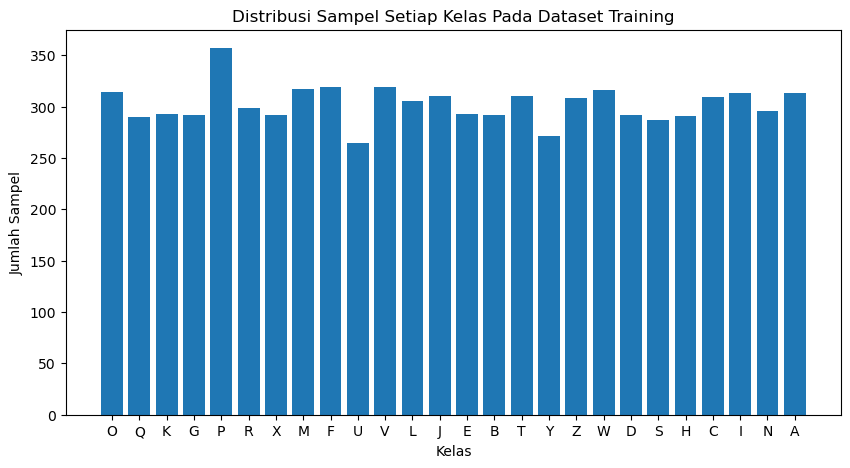

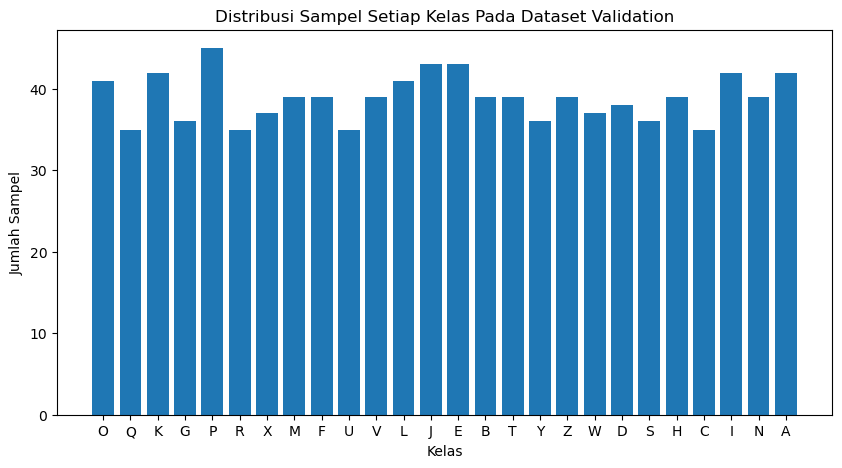

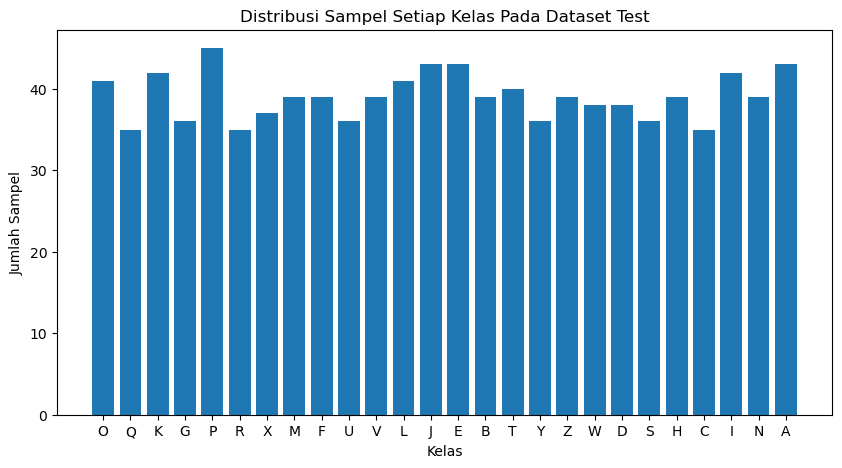

In [58]:
# Menampilkan distribusi sampel setiap kelas dalam bentuk grafik
def plot_class_distribution(class_counts, dataset_name):
    plt.figure(figsize=(10, 5))
    plt.bar(class_counts.keys(), class_counts.values())
    plt.title(f'Distribusi Sampel Setiap Kelas Pada Dataset {dataset_name}')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Sampel')
    plt.xticks(rotation=0)
    plt.show()

# Plot distribusi sampel
plot_class_distribution(train_class_counts, "Training")
plot_class_distribution(val_class_counts, "Validation")
plot_class_distribution(test_class_counts, "Test")

## Data Normalization

In [59]:
TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')
TEST_DIR = os.path.join(BASE_DIR, 'test')

IMAGE_SIZE = (150, 150)
BATCH_SIZE = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    class_names=None,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    label_mode='categorical',
    shuffle=True,
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    labels='inferred',
    class_names=None,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    label_mode='categorical',
    shuffle=True,
)

test_dataset = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred',
    class_names=None,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    label_mode='categorical',
    shuffle=True,
)

# Lanjutkan dengan normalisasi dataset
normalization_layer = tf.keras.layers.Rescaling(1./255)
train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))
test_dataset = test_dataset.map(lambda x, y: (normalization_layer(x), y))

Found 7863 files belonging to 26 classes.
Found 1011 files belonging to 26 classes.
Found 1015 files belonging to 26 classes.


In [60]:
SHUFFLE_BUFFER_SIZE = 100
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_dataset_prepared = (train_dataset
                       .shuffle(SHUFFLE_BUFFER_SIZE)
                       .cache()
                       .prefetch(PREFETCH_BUFFER_SIZE)
                       )

val_dataset_prepared = (val_dataset
                      .shuffle(SHUFFLE_BUFFER_SIZE)
                      .cache()
                      .prefetch(PREFETCH_BUFFER_SIZE)
                    )

test_dataset_prepared = (test_dataset
                      .cache()
                      .prefetch(PREFETCH_BUFFER_SIZE)
                    )

## Building Model CNN 5 Layers

In [62]:
from tensorflow.keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,Dropout
from tensorflow.keras.models import Sequential
from keras.optimizers import Adam

#Mendefinisikan CNN Model
model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu', input_shape=IMAGE_SIZE + (3,))) 
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(256, (3,3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(256, (3,3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
#Output
model.add(Dense(26, activation='softmax'))

## Compiling Model

In [63]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(0.0001),
    metrics=['accuracy']
)

In [64]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 5, 5, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,648,474 (6.29 MB)

 Trainable params: 1,648,474 (6.29 MB)

 Non-trainable params: 0 (0.00 B)

## Model Training

In [65]:
training_history = model.fit (
    train_dataset_prepared,
    validation_data = val_dataset_prepared,
    epochs=50
)

Epoch 1/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.0400 - loss: 3.2585 - val_accuracy: 0.0455 - val_loss: 3.2559
Epoch 2/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.0589 - loss: 3.2305 - val_accuracy: 0.3304 - val_loss: 2.4034
Epoch 3/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.3286 - loss: 2.2700 - val_accuracy: 0.6835 - val_loss: 1.2156
Epoch 4/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.5659 - loss: 1.4785 - val_accuracy: 0.7438 - val_loss: 0.9335
Epoch 5/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.6551 - loss: 1.1867 - val_accuracy: 0.7666 - val_loss: 0.8073
Epoch 6/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.6908 - loss: 1.0285 - val_accuracy: 0.7864 - val_loss: 0.7160
Epoch 7/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - accuracy: 0.7316 - loss: 0.8963 - val_accuracy: 0.8002 - val_loss: 0.6624
Epoch 8/50
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.7526 - loss: 0.8243 - val_ac

## Visualization of Accuracy Model Evaluation

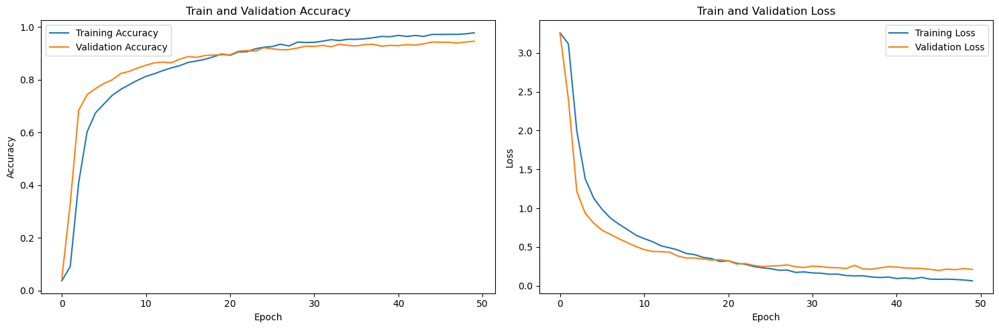

In [67]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5)) 

# Plot Accuracy
axes[0].plot(training_history.history['accuracy'], label='Training Accuracy')
axes[0].plot(training_history.history['val_accuracy'], label='Validation Accuracy')
axes[0].set_title('Train and Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

# Plot Loss
axes[1].plot(training_history.history['loss'], label='Training Loss')
axes[1].plot(training_history.history['val_loss'], label='Validation Loss')
axes[1].set_title('Train and Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()  
plt.show()

## Model Evaluation

In [68]:
# Evaluasi model dengan dataset test
test_loss, test_accuracy = model.evaluate(test_dataset_prepared)

print(f"Test loss: {test_loss}")
print(f"Test accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9483 - loss: 0.1971
Test loss: 0.22142477333545685
Test accuracy: 0.9399014711380005


## Saving Model

In [69]:
# Simpan model TFLite ke file
converter = tf.lite.TFLiteConverter.from_keras_model(model) 
tflite_model = converter.convert()
with open('trained_model.tflite', 'wb') as f:
    f.write(tflite_model)

# Simpan model ke dalam file h5
model.save('trained_model.h5')
# Simpan model ke dalam file keras
model.save('trained_model.keras')

INFO:tensorflow:Assets written to: /tmp/tmpwpeh4tx3/assets


INFO:tensorflow:Assets written to: /tmp/tmpwpeh4tx3/assets


Saved artifact at '/tmp/tmpwpeh4tx3'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name='keras_tensor_1166')
Output Type:
  TensorSpec(shape=(None, 26), dtype=tf.float32, name=None)
Captures:
  139871682441872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682442256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682443024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682443600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682443408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682444368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682444176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682443984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682445136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139871682442832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13987168

W0000 00:00:1733077653.985117   11270 tf_tfl_flatbuffer_helpers.cc:392] Ignored output_format.
W0000 00:00:1733077653.986077   11270 tf_tfl_flatbuffer_helpers.cc:395] Ignored drop_control_dependency.
2024-12-02 01:27:33.994135: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmpwpeh4tx3
2024-12-02 01:27:33.995172: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2024-12-02 01:27:33.995193: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmpwpeh4tx3
2024-12-02 01:27:34.007532: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:388] MLIR V1 optimization pass is not enabled
2024-12-02 01:27:34.009355: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2024-12-02 01:27:34.088669: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmpwpeh4tx3
2024-12-02 01:27:34.105806: I tensorflow/cc/saved_model/loader.cc

## Testing Model

Testing Model H5

In [70]:
# Memuat kembali model
from tensorflow.keras.models import load_model

# Memuat kembali model dari file .h5
model_h5 = load_model('trained_model.h5')

# Evaluasi model pada dataset pengujian
test_loss, test_accuracy = model_h5.evaluate(test_dataset_prepared)

# Menampilkan hasil evaluasi
print("Hasil evaluasi model .h5:")
print(f"Test loss: {test_loss}")
print(f"Test accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.9483 - loss: 0.1971
Hasil evaluasi model .h5:
Test loss: 0.22142477333545685
Test accuracy: 0.9399014711380005


Testing Model TfLite

In [72]:
# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="trained_model.tflite")
interpreter.allocate_tensors()

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [73]:
# Dapatkan detail input dan output
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("Input Details:", input_details)
print("Output Details:", output_details)

Input Details: [{'name': 'serving_default_keras_tensor_1166:0', 'index': 0, 'shape': array([  1, 150, 150,   3], dtype=int32), 'shape_signature': array([ -1, 150, 150,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
Output Details: [{'name': 'StatefulPartitionedCall_1:0', 'index': 35, 'shape': array([ 1, 26], dtype=int32), 'shape_signature': array([-1, 26], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


In [92]:
# Masukkan gambar yang ingin diuji
# image = tf.io.read_file('bisindo/images/test/A/flip013.jpg')
image = tf.io.read_file('bisindo/images/test/J/flip018.jpg')
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.resize(image, (150, 150))  # Ubah ukuran gambar
image = tf.cast(image, tf.float32) / 255.0  # Normalisasi ke [0, 1]

# Dimensi batch (1, 150, 150, 3)
image = tf.expand_dims(image, axis=0)

# Set input tensor
interpreter.set_tensor(input_details[0]['index'], image.numpy())

# Jalankan model
interpreter.invoke()

# Ambil output prediksi
output = interpreter.get_tensor(output_details[0]['index'])

# Prediksi kelas
predicted_class = np.argmax(output)

# labels
class_names = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

# Menampilkan nama kelas yang diprediksi
print(f"Predicted class name: {class_names[predicted_class]}")

Predicted class name: J


## Model Evaluation and Performance Metrics

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


<Figure size 1000x1000 with 0 Axes>

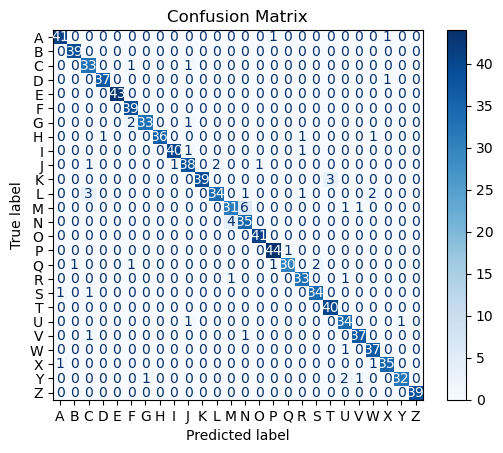

Classification Report
              precision    recall  f1-score   support

           A       0.95      0.95      0.95        43
           B       0.97      1.00      0.99        39
           C       0.85      0.94      0.89        35
           D       0.97      0.97      0.97        38
           E       1.00      1.00      1.00        43
           F       0.91      1.00      0.95        39
           G       0.97      0.92      0.94        36
           H       1.00      0.92      0.96        39
           I       0.98      0.95      0.96        42
           J       0.90      0.88      0.89        43
           K       1.00      0.93      0.96        42
           L       0.94      0.83      0.88        41
           M       0.86      0.79      0.83        39
           N       0.81      0.90      0.85        39
           O       0.98      1.00      0.99        41
           P       0.96      0.98      0.97        45
           Q       0.97      0.86      0.91        35
     

In [93]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Prediksi label dari model
y_pred = np.argmax(model.predict(test_dataset_prepared), axis=1)

# Ambil label sebenarnya dari dataset test
y_true = np.concatenate([y.numpy() for _, y in test_dataset_prepared], axis=0)
# Mengambil indeks kelas dari one-hot encoding
y_true = np.argmax(y_true, axis=1)

# Hitung confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Definisikan kelas label
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

# Tampilkan confusion matrix
plt.figure(figsize=(10, 10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Hitung dan tampilkan classification report
report = classification_report(y_true, y_pred, target_names=classes)
print('Classification Report')
print(report)